In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
!python -m pip install pyyaml==5.1
# Detectron2 has not released pre-built binaries for the latest pytorch (https://github.com/facebookresearch/detectron2/issues/4053)
# so we install from source instead. This takes a few minutes.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

# Install pre-built detectron2 that matches pytorch version, if released:
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/{CUDA_VERSION}/{TORCH_VERSION}/index.html

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 13.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... error
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [34 lines of output]
      Traceback (most recent call last):
        File "<string>", line 2, in <module>
        File "<pip-setuptools-caller>", line 34, in <module>
        File "/tmp/pip-install-p6tugh94/pyyaml_9d8730d7b0c7452486db73fb3d6cf9d1/setup.py", line 291, in <module>
          setup(
        File "/opt/conda/lib/python3.10/site-packages/setuptools/_distutils/core.py", line 185, in setup
          return run_commands(dist)
        File "/opt/conda/lib/python3.10/site-packages/setuptools/_distutils/core.py", line 201, in run_commands
          dist.run_commands()
        File "/opt/conda/lib/python3.10/site-packages/setuptools/_distutils/dist.py", line 969, in run_commands
          self.run_command(cmd)
        File "/opt/conda/lib/pyth

In [3]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [4]:
!kaggle datasets download -d tannergi/chess-piece-detection

Dataset URL: https://www.kaggle.com/datasets/tannergi/chess-piece-detection
License(s): Attribution 4.0 International (CC BY 4.0)
 99%|███████████████████████████████████████▍| 164M/166M [00:10<00:00, 17.7MB/s]
100%|████████████████████████████████████████| 166M/166M [00:10<00:00, 16.9MB/s]


In [5]:
!unzip chess-piece-detection.zip

Archive:  chess-piece-detection.zip
  inflating: Chess Detection/annotations/IMG_1989.xml  
  inflating: Chess Detection/annotations/IMG_1990.xml  
  inflating: Chess Detection/annotations/IMG_1991.xml  
  inflating: Chess Detection/annotations/IMG_1992.xml  
  inflating: Chess Detection/annotations/IMG_1993.xml  
  inflating: Chess Detection/annotations/IMG_1994.xml  
  inflating: Chess Detection/annotations/IMG_1995.xml  
  inflating: Chess Detection/annotations/IMG_1996.xml  
  inflating: Chess Detection/annotations/IMG_1997.xml  
  inflating: Chess Detection/annotations/IMG_1998.xml  
  inflating: Chess Detection/annotations/IMG_1999.xml  
  inflating: Chess Detection/annotations/IMG_2000.xml  
  inflating: Chess Detection/annotations/IMG_2001.xml  
  inflating: Chess Detection/annotations/IMG_2002.xml  
  inflating: Chess Detection/annotations/IMG_2003.xml  
  inflating: Chess Detection/annotations/IMG_2004.xml  
  inflating: Chess Detection/annotations/IMG_2005.xml  
  inflating:

In [6]:
import os
import numpy as np
import json
from detectron2.structures import BoxMode
import itertools
import cv2
import xml.etree.ElementTree as ET


# write a function that loads the dataset into detectron2's standard format
def get_dataset_dicts(annotation_path, image_path):
    classes = ['white-rook', 'white-knight', 'white-bishop', 'white-king', 'white-queen', 'white-pawn', 'black-rook', 'black-knight', 'black-bishop', 'black-king', 'black-queen', 'black-pawn']

    dataset_dicts = []
    for idx, filename in enumerate(os.listdir(annotation_path)):
        record = {}
        root = ET.parse(os.path.join(annotation_path, filename)).getroot()
        record["file_name"] = os.path.join(image_path, root.find('filename').text)
        record["height"] = 2248
        record["width"] = 4000

        objs = []
        for member in root.findall('object'):
          obj = {
              'bbox': [int(member[4][0].text), int(member[4][1].text), int(member[4][2].text), int(member[4][3].text)],
              'bbox_mode': BoxMode.XYXY_ABS,
              'category_id': classes.index(member[0].text),
              "iscrowd": 0
          }
          objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [7]:
from detectron2.data import DatasetCatalog, MetadataCatalog

classes = ['white-rook', 'white-knight', 'white-bishop', 'white-king', 'white-queen', 'white-pawn', 'black-rook', 'black-knight', 'black-bishop', 'black-king', 'black-queen', 'black-pawn']

DatasetCatalog.register('chess_piece_dataset', lambda: get_dataset_dicts('Chess Detection/annotations', 'Chess Detection/images'))
MetadataCatalog.get('chess_piece_dataset').set(thing_classes=classes)
chess_metadata = MetadataCatalog.get('chess_piece_dataset')

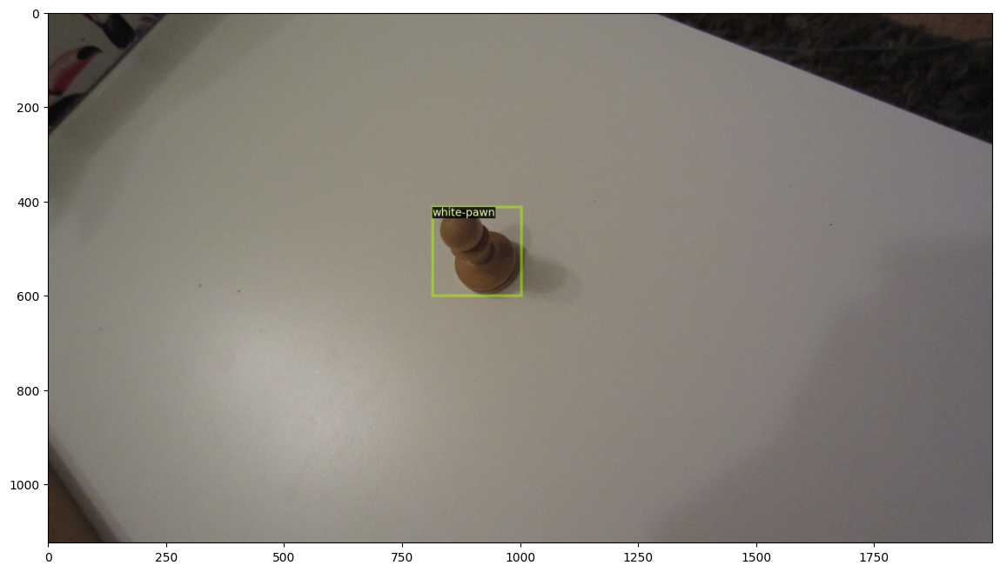

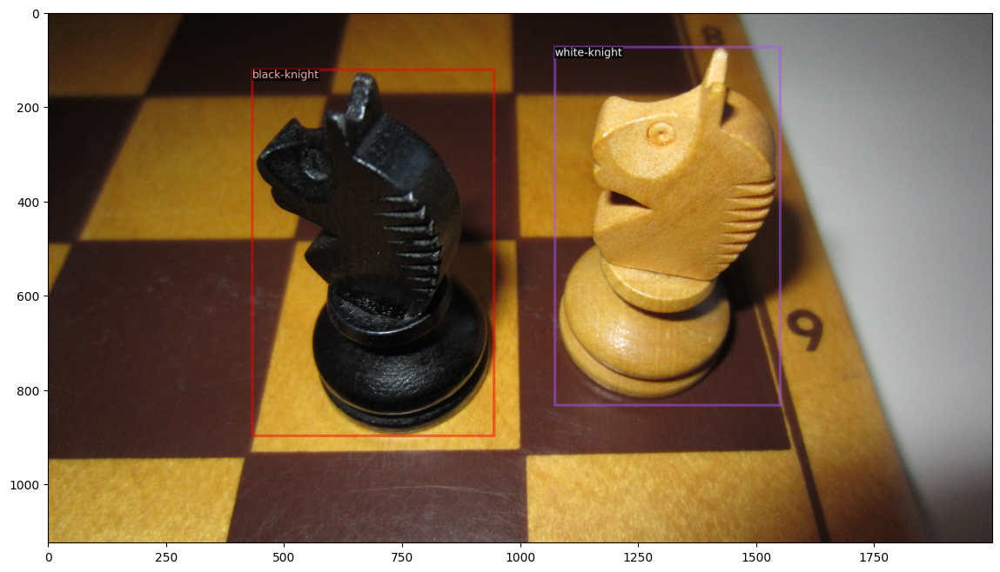

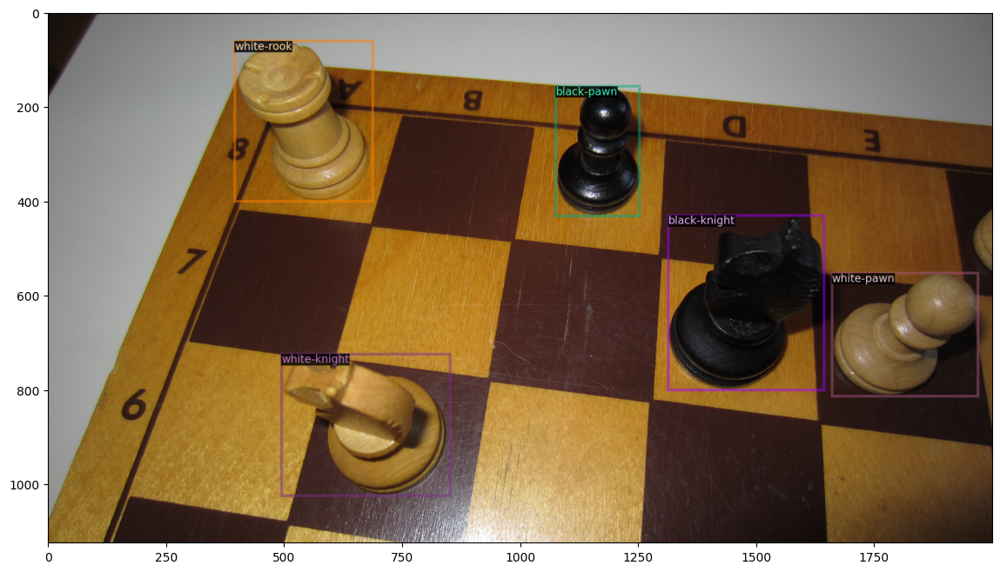

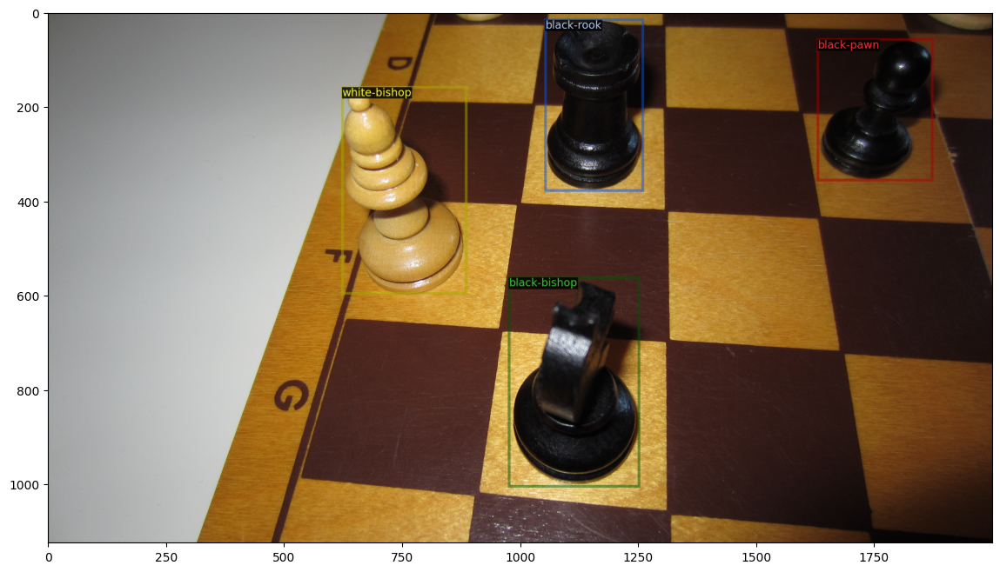

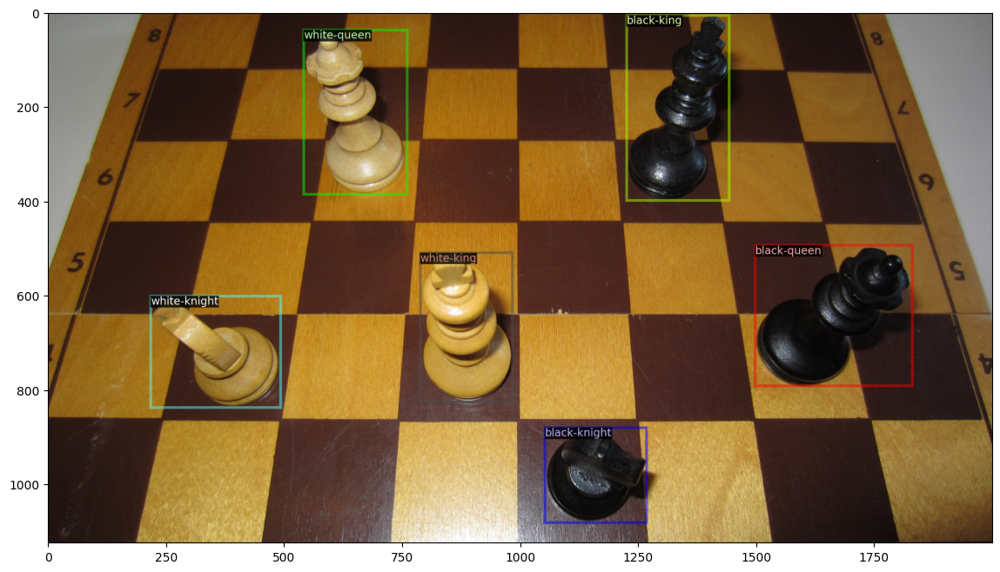

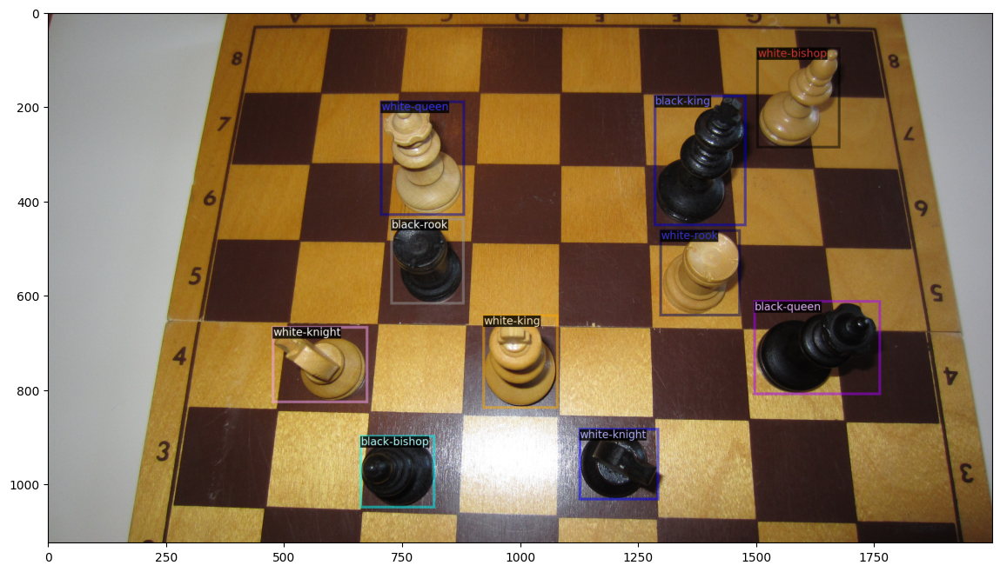

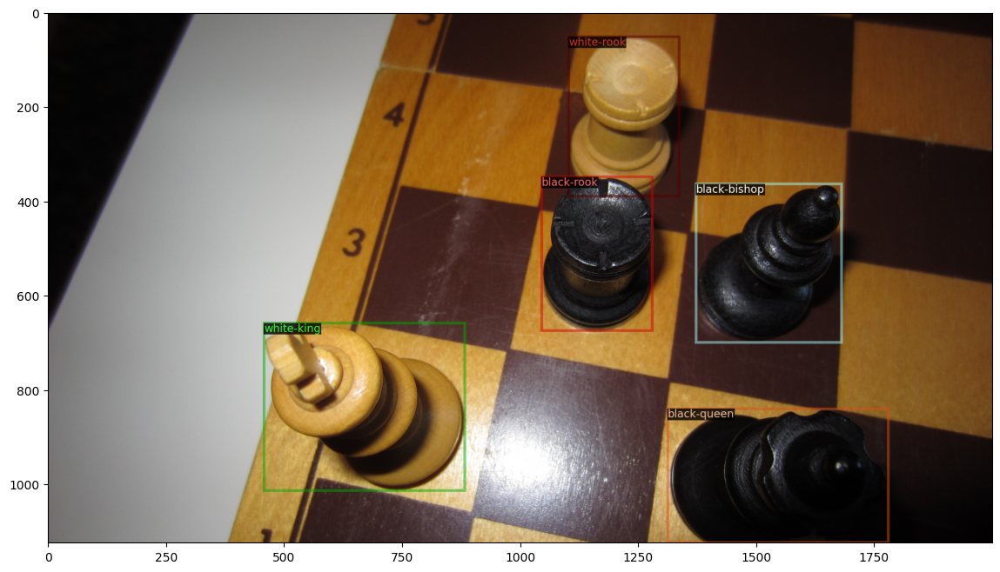

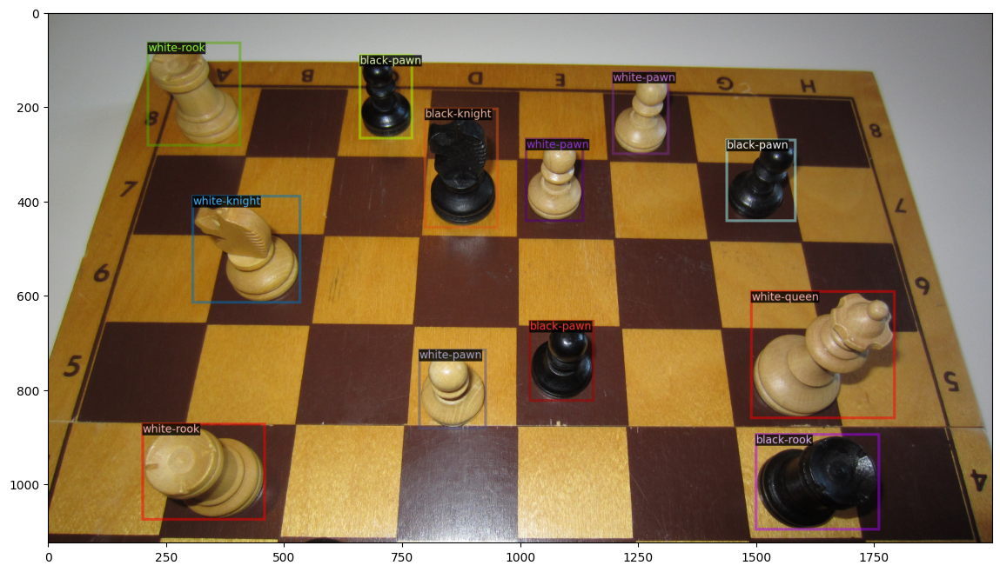

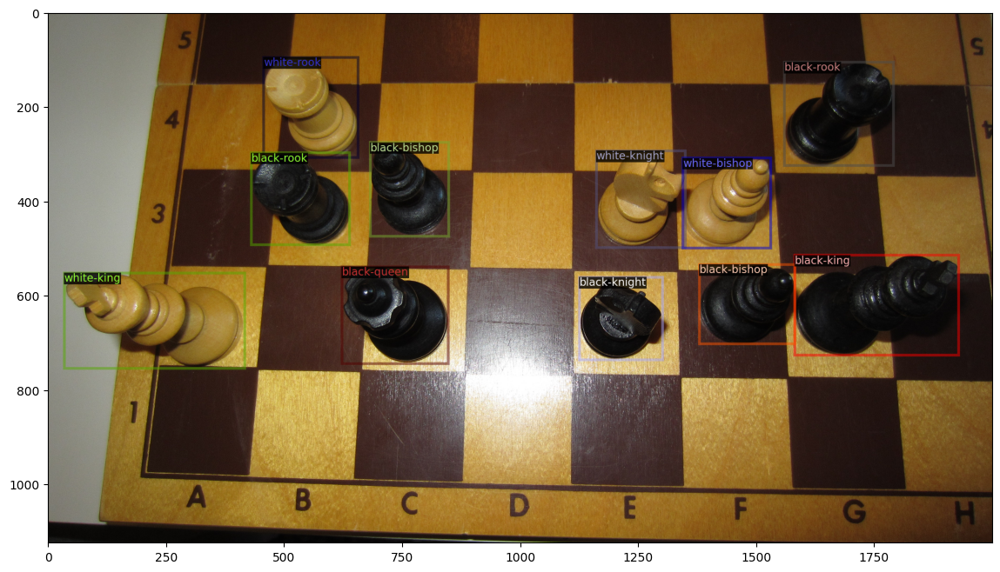

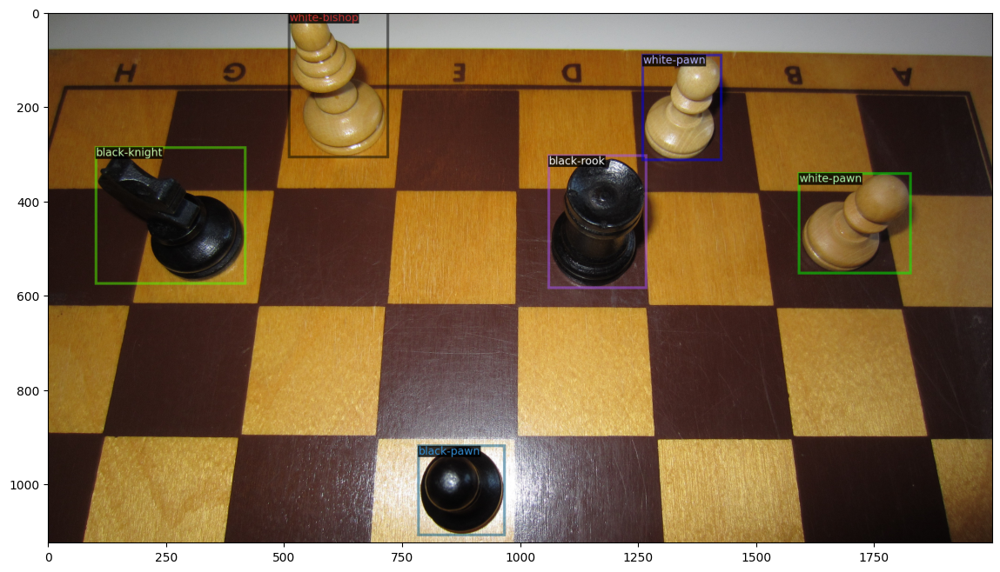

In [8]:
import random
from detectron2.utils.visualizer import Visualizer

dataset_dicts = DatasetCatalog.get('chess_piece_dataset')
for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    v = Visualizer(img[:, :, ::-1], metadata=chess_metadata, scale=0.5)
    v = v.draw_dataset_dict(d)
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

In [9]:
import os
import logging
import time
from detectron2.engine import DefaultTrainer, HookBase
from detectron2.config import get_cfg
from detectron2 import model_zoo
from tabulate import tabulate
from detectron2.data import DatasetCatalog, MetadataCatalog

# Configure logging
log_file = 'training_log.txt'
logging.basicConfig(filename=log_file, level=logging.INFO)

# Print message to console to confirm logging setup
print(f"Logging to {log_file}")

# List of learning rates to experiment with
learning_rates = [0.001, 0.005, 0.01]

# Number of iterations and runs
num_iterations = 1000
num_runs = 10

# Data structure to store results
results = []

# Custom hook to log the training progress
class LossLoggerHook(HookBase):
    def __init__(self):
        super().__init__()

    def after_step(self):
        if self.trainer.storage.iter % 20 == 0:  # Log every 20 iterations
            total_loss = self.trainer.storage.history("total_loss").latest()
            logging.info(f"iter: {self.trainer.storage.iter} total_loss: {total_loss}")
            print(f"Logged iteration {self.trainer.storage.iter}")

# Function to train with a specific learning rate
def train_with_learning_rate(lr):
    cfg = get_cfg()
    cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/rpn_R_50_FPN_1x.yaml"))
    cfg.DATASETS.TRAIN = ('chess_piece_dataset',)
    cfg.DATASETS.TEST = ()  # no metrics implemented for this dataset
    cfg.DATALOADER.NUM_WORKERS = 2
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/rpn_R_50_FPN_1x.yaml")
    cfg.SOLVER.IMS_PER_BATCH = 2
    cfg.SOLVER.MAX_ITER = num_iterations
    cfg.SOLVER.STEPS = []  # do not decay learning rate
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 12
    cfg.SOLVER.BASE_LR = lr  # Set learning rate

    # Implement gradient clipping correctly
    cfg.SOLVER.CLIP_GRADIENTS.ENABLED = True
    cfg.SOLVER.CLIP_GRADIENTS.CLIP_TYPE = "norm"
    cfg.SOLVER.CLIP_GRADIENTS.CLIP_VALUE = 1.0

    os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
    trainer = DefaultTrainer(cfg)
    trainer.register_hooks([LossLoggerHook()])

    start_time = time.time()
    trainer.resume_or_load(resume=False)
    trainer.train()
    end_time = time.time()

    # Get the minimum loss over all iterations
    min_loss = min(trainer.storage.history("total_loss").values())

    return min_loss, end_time - start_time

# Run training for each learning rate
for lr in learning_rates:
    lr_results = []
    for run in range(num_runs):
        logging.info(f"Starting training with learning rate: {lr}, run: {run + 1}")
        print(f"Starting training with learning rate: {lr}, run: {run + 1}")
        min_loss, duration = train_with_learning_rate(lr)
        lr_results.append([lr, run + 1, min_loss, duration])
    results.extend(lr_results)

# Aggregate results for each learning rate
summary_results = []
for lr in learning_rates:
    lr_runs = [result for result in results if result[0] == lr]
    min_loss = min(lr_runs, key=lambda x: x[2])[2]
    total_time = sum(run[3] for run in lr_runs)
    summary_results.append([lr, min_loss, total_time])

# Tabulate the detailed results for each run
headers = ["Learning Rate", "Run", "Minimum Loss", "Duration (s)"]
print(tabulate(results, headers, floatfmt=".6f"))

# Log the detailed results to the file
logging.info(tabulate(results, headers, floatfmt=".6f"))

# Tabulate and print the summary results
summary_headers = ["Learning Rate", "Minimum Loss", "Total Time (s)"]
print(tabulate(summary_results, summary_headers, floatfmt=".6f"))

# Log the summary results to the file
logging.info(tabulate(summary_results, summary_headers, floatfmt=".6f"))

# Tabulate the detailed results for each learning rate
for lr in learning_rates:
    lr_runs = [result for result in results if result[0] == lr]
    print(f"\nDetailed results for learning rate: {lr}")
    print(tabulate(lr_runs, headers, floatfmt=".6f"))
    logging.info(f"\nDetailed results for learning rate: {lr}")
    logging.info(tabulate(lr_runs, headers, floatfmt=".6f"))


Logging to training_log.txt
Starting training with learning rate: 0.001, run: 1
[06/04 06:00:44 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (n

model_final_02ce48.pkl: 110MB [00:05, 19.6MB/s]                              


[06/04 06:00:50 d2.engine.train_loop]: Starting training from iteration 0


/opt/conda/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /usr/local/src/pytorch/aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Logged iteration 0
[06/04 06:01:00 d2.utils.events]:  eta: 0:06:01  iter: 19  total_loss: 0.02174  loss_rpn_cls: 0.008139  loss_rpn_loc: 0.01619    time: 0.3610  last_time: 0.3251  data_time: 0.0993  last_data_time: 0.0817   lr: 1.9981e-05  max_mem: 2245M


2024-06-04 06:01:02.978238: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-04 06:01:02.978342: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-04 06:01:03.089826: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Logged iteration 20
[06/04 06:01:19 d2.utils.events]:  eta: 0:05:51  iter: 39  total_loss: 0.01838  loss_rpn_cls: 0.006635  loss_rpn_loc: 0.01081    time: 0.3622  last_time: 0.3191  data_time: 0.0940  last_data_time: 0.0633   lr: 3.9961e-05  max_mem: 2245M
Logged iteration 40
[06/04 06:01:27 d2.utils.events]:  eta: 0:05:48  iter: 59  total_loss: 0.01665  loss_rpn_cls: 0.005134  loss_rpn_loc: 0.01044    time: 0.3664  last_time: 0.3549  data_time: 0.1006  last_data_time: 0.0871   lr: 5.9941e-05  max_mem: 2245M
Logged iteration 60
[06/04 06:01:34 d2.utils.events]:  eta: 0:05:44  iter: 79  total_loss: 0.01765  loss_rpn_cls: 0.006321  loss_rpn_loc: 0.01324    time: 0.3676  last_time: 0.3967  data_time: 0.0926  last_data_time: 0.1194   lr: 7.9921e-05  max_mem: 2245M
Logged iteration 80
[06/04 06:01:42 d2.utils.events]:  eta: 0:05:37  iter: 99  total_loss: 0.02258  loss_rpn_cls: 0.007043  loss_rpn_loc: 0.01174    time: 0.3715  last_time: 0.3797  data_time: 0.1134  last_data_time: 0.0981   lr:

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 06:07:23 d2.utils.events]:  eta: 0:06:40  iter: 19  total_loss: 0.02785  loss_rpn_cls: 0.007755  loss_rpn_loc: 0.01773    time: 0.4102  last_time: 0.3855  data_time: 0.1515  last_data_time: 0.0817   lr: 1.9981e-05  max_mem: 2247M
Logged iteration 20
[06/04 06:07:31 d2.utils.events]:  eta: 0:06:26  iter: 39  total_loss: 0.01709  loss_rpn_cls: 0.005033  loss_rpn_loc: 0.0114    time: 0.4126  last_time: 0.3756  data_time: 0.1385  last_data_time: 0.1511   lr: 3.9961e-05  max_mem: 2247M
Logged iteration 40
[06/04 06:07:39 d2.utils.events]:  eta: 0:06:18  iter: 59  total_loss: 0.02075  loss_rpn_cls: 0.008244  loss_rpn_loc: 0.01249    time: 0.4092  last_time: 0.3609  data_time: 0.1322  last_data_time: 0.0806   lr: 5.9941e-05  max_mem: 2247M
Logged iteration 60
[06/04 06:07:47 d2.utils.events]:  eta: 0:06:10  iter: 79  total_loss: 0.0156  loss_rpn_cls: 0.004072  loss_rpn_loc: 0.01017    time: 0.4057  last_time: 0.4271  data_time: 0.1177  last_data_time: 0.1262   lr: 7.

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 3
[06/04 06:14:05 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 06:14:14 d2.utils.events]:  eta: 0:07:03  iter: 19  total_loss: 0.01911  loss_rpn_cls: 0.004841  loss_rpn_loc: 0.01269    time: 0.4273  last_time: 0.3938  data_time: 0.1729  last_data_time: 0.1117   lr: 1.9981e-05  max_mem: 2247M
Logged iteration 20
[06/04 06:14:22 d2.utils.events]:  eta: 0:06:35  iter: 39  total_loss: 0.02587  loss_rpn_cls: 0.01141  loss_rpn_loc: 0.01352    time: 0.4106  last_time: 0.3638  data_time: 0.1332  last_data_time: 0.1178   lr: 3.9961e-05  max_mem: 2247M
Logged iteration 40
[06/04 06:14:30 d2.utils.events]:  eta: 0:06:24  iter: 59  total_loss: 0.0198  loss_rpn_cls: 0.006992  loss_rpn_loc: 0.0127    time: 0.4065  last_time: 0.3793  data_time: 0.1318  last_data_time: 0.1332   lr: 5.9941e-05  max_mem: 2247M
Logged iteration 60
[06/04 06:14:38 d2.utils.events]:  eta: 0:06:13  iter: 79  total_loss: 0.01998  loss_rpn_cls: 0.006991  loss_rpn_loc: 0.01057    time: 0.4034  last_time: 0.3997  data_time: 0.1213  last_data_time: 0.1213   lr: 7.9

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 4
[06/04 06:20:56 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 06:21:05 d2.utils.events]:  eta: 0:06:31  iter: 19  total_loss: 0.02098  loss_rpn_cls: 0.00853  loss_rpn_loc: 0.0113    time: 0.4152  last_time: 0.5280  data_time: 0.1666  last_data_time: 0.2487   lr: 1.9981e-05  max_mem: 2248M
Logged iteration 20
[06/04 06:21:13 d2.utils.events]:  eta: 0:06:21  iter: 39  total_loss: 0.01828  loss_rpn_cls: 0.005129  loss_rpn_loc: 0.009321    time: 0.4031  last_time: 0.3855  data_time: 0.1192  last_data_time: 0.0934   lr: 3.9961e-05  max_mem: 2248M
Logged iteration 40
[06/04 06:21:21 d2.utils.events]:  eta: 0:06:15  iter: 59  total_loss: 0.02431  loss_rpn_cls: 0.00781  loss_rpn_loc: 0.01527    time: 0.4101  last_time: 0.3890  data_time: 0.1539  last_data_time: 0.1027   lr: 5.9941e-05  max_mem: 2248M
Logged iteration 60
[06/04 06:21:29 d2.utils.events]:  eta: 0:06:17  iter: 79  total_loss: 0.01709  loss_rpn_cls: 0.008083  loss_rpn_loc: 0.0109    time: 0.4113  last_time: 0.4151  data_time: 0.1324  last_data_time: 0.1279   lr: 7.9

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 5
[06/04 06:27:44 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 06:27:53 d2.utils.events]:  eta: 0:06:29  iter: 19  total_loss: 0.01938  loss_rpn_cls: 0.00625  loss_rpn_loc: 0.01298    time: 0.3975  last_time: 0.4190  data_time: 0.1561  last_data_time: 0.1291   lr: 1.9981e-05  max_mem: 2248M
Logged iteration 20
[06/04 06:28:01 d2.utils.events]:  eta: 0:06:40  iter: 39  total_loss: 0.02171  loss_rpn_cls: 0.006536  loss_rpn_loc: 0.01293    time: 0.4083  last_time: 0.4309  data_time: 0.1573  last_data_time: 0.1926   lr: 3.9961e-05  max_mem: 2248M
Logged iteration 40
[06/04 06:28:09 d2.utils.events]:  eta: 0:06:31  iter: 59  total_loss: 0.01921  loss_rpn_cls: 0.006661  loss_rpn_loc: 0.01011    time: 0.4102  last_time: 0.4364  data_time: 0.1340  last_data_time: 0.1476   lr: 5.9941e-05  max_mem: 2248M
Logged iteration 60
[06/04 06:28:18 d2.utils.events]:  eta: 0:06:28  iter: 79  total_loss: 0.02134  loss_rpn_cls: 0.004404  loss_rpn_loc: 0.01465    time: 0.4169  last_time: 0.4523  data_time: 0.1643  last_data_time: 0.1786   lr: 7

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 6
[06/04 06:34:36 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 06:34:45 d2.utils.events]:  eta: 0:06:30  iter: 19  total_loss: 0.02132  loss_rpn_cls: 0.009875  loss_rpn_loc: 0.01209    time: 0.4213  last_time: 0.3829  data_time: 0.1632  last_data_time: 0.1030   lr: 1.9981e-05  max_mem: 2248M
Logged iteration 20
[06/04 06:34:53 d2.utils.events]:  eta: 0:06:22  iter: 39  total_loss: 0.01573  loss_rpn_cls: 0.005348  loss_rpn_loc: 0.01099    time: 0.4058  last_time: 0.4196  data_time: 0.1162  last_data_time: 0.1379   lr: 3.9961e-05  max_mem: 2248M
Logged iteration 40
[06/04 06:35:01 d2.utils.events]:  eta: 0:06:19  iter: 59  total_loss: 0.01879  loss_rpn_cls: 0.006992  loss_rpn_loc: 0.0125    time: 0.4053  last_time: 0.4129  data_time: 0.1293  last_data_time: 0.1351   lr: 5.9941e-05  max_mem: 2248M
Logged iteration 60
[06/04 06:35:09 d2.utils.events]:  eta: 0:06:17  iter: 79  total_loss: 0.02281  loss_rpn_cls: 0.007289  loss_rpn_loc: 0.01323    time: 0.4044  last_time: 0.4199  data_time: 0.1311  last_data_time: 0.1423   lr: 7

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 7
[06/04 06:41:23 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 06:41:31 d2.utils.events]:  eta: 0:06:24  iter: 19  total_loss: 0.01774  loss_rpn_cls: 0.00702  loss_rpn_loc: 0.0115    time: 0.3952  last_time: 0.3801  data_time: 0.1476  last_data_time: 0.1288   lr: 1.9981e-05  max_mem: 2248M
Logged iteration 20
[06/04 06:41:40 d2.utils.events]:  eta: 0:06:31  iter: 39  total_loss: 0.02169  loss_rpn_cls: 0.008623  loss_rpn_loc: 0.01324    time: 0.4135  last_time: 0.4251  data_time: 0.1512  last_data_time: 0.1392   lr: 3.9961e-05  max_mem: 2248M
Logged iteration 40
[06/04 06:41:48 d2.utils.events]:  eta: 0:06:15  iter: 59  total_loss: 0.02613  loss_rpn_cls: 0.009412  loss_rpn_loc: 0.01599    time: 0.4061  last_time: 0.3956  data_time: 0.1251  last_data_time: 0.1437   lr: 5.9941e-05  max_mem: 2248M
Logged iteration 60
[06/04 06:41:56 d2.utils.events]:  eta: 0:06:08  iter: 79  total_loss: 0.01734  loss_rpn_cls: 0.005409  loss_rpn_loc: 0.00904    time: 0.4070  last_time: 0.4258  data_time: 0.1336  last_data_time: 0.1354   lr: 7.

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 8
[06/04 06:48:12 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 06:48:21 d2.utils.events]:  eta: 0:06:28  iter: 19  total_loss: 0.01621  loss_rpn_cls: 0.005881  loss_rpn_loc: 0.009341    time: 0.4052  last_time: 0.3909  data_time: 0.1532  last_data_time: 0.1337   lr: 1.9981e-05  max_mem: 2248M
Logged iteration 20
[06/04 06:48:29 d2.utils.events]:  eta: 0:06:28  iter: 39  total_loss: 0.02828  loss_rpn_cls: 0.01254  loss_rpn_loc: 0.0162    time: 0.4104  last_time: 0.4118  data_time: 0.1385  last_data_time: 0.1345   lr: 3.9961e-05  max_mem: 2248M
Logged iteration 40
[06/04 06:48:37 d2.utils.events]:  eta: 0:06:17  iter: 59  total_loss: 0.01648  loss_rpn_cls: 0.004184  loss_rpn_loc: 0.01054    time: 0.4078  last_time: 0.4287  data_time: 0.1223  last_data_time: 0.1414   lr: 5.9941e-05  max_mem: 2248M
Logged iteration 60
[06/04 06:48:45 d2.utils.events]:  eta: 0:06:12  iter: 79  total_loss: 0.02056  loss_rpn_cls: 0.005629  loss_rpn_loc: 0.01193    time: 0.4054  last_time: 0.4355  data_time: 0.1257  last_data_time: 0.1526   lr: 7

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 9
[06/04 06:55:00 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 06:55:09 d2.utils.events]:  eta: 0:06:45  iter: 19  total_loss: 0.02091  loss_rpn_cls: 0.007477  loss_rpn_loc: 0.01283    time: 0.4166  last_time: 0.4143  data_time: 0.1598  last_data_time: 0.1317   lr: 1.9981e-05  max_mem: 2248M
Logged iteration 20
[06/04 06:55:17 d2.utils.events]:  eta: 0:06:33  iter: 39  total_loss: 0.01672  loss_rpn_cls: 0.008245  loss_rpn_loc: 0.008598    time: 0.4051  last_time: 0.3704  data_time: 0.1283  last_data_time: 0.1129   lr: 3.9961e-05  max_mem: 2248M
Logged iteration 40
[06/04 06:55:25 d2.utils.events]:  eta: 0:06:25  iter: 59  total_loss: 0.02162  loss_rpn_cls: 0.007782  loss_rpn_loc: 0.01272    time: 0.4093  last_time: 0.3716  data_time: 0.1484  last_data_time: 0.0877   lr: 5.9941e-05  max_mem: 2248M
Logged iteration 60
[06/04 06:55:33 d2.utils.events]:  eta: 0:06:12  iter: 79  total_loss: 0.01702  loss_rpn_cls: 0.007109  loss_rpn_loc: 0.01155    time: 0.4055  last_time: 0.4268  data_time: 0.1185  last_data_time: 0.1417   lr:

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 10
[06/04 07:01:48 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 07:01:56 d2.utils.events]:  eta: 0:06:28  iter: 19  total_loss: 0.01625  loss_rpn_cls: 0.004589  loss_rpn_loc: 0.01245    time: 0.3954  last_time: 0.3640  data_time: 0.1446  last_data_time: 0.0719   lr: 1.9981e-05  max_mem: 2249M
Logged iteration 20
[06/04 07:02:04 d2.utils.events]:  eta: 0:06:20  iter: 39  total_loss: 0.02322  loss_rpn_cls: 0.009422  loss_rpn_loc: 0.01459    time: 0.3964  last_time: 0.3746  data_time: 0.1275  last_data_time: 0.0974   lr: 3.9961e-05  max_mem: 2249M
Logged iteration 40
[06/04 07:02:12 d2.utils.events]:  eta: 0:06:16  iter: 59  total_loss: 0.02395  loss_rpn_cls: 0.008521  loss_rpn_loc: 0.01492    time: 0.3994  last_time: 0.3744  data_time: 0.1330  last_data_time: 0.1317   lr: 5.9941e-05  max_mem: 2249M
Logged iteration 60
[06/04 07:02:21 d2.utils.events]:  eta: 0:06:10  iter: 79  total_loss: 0.02152  loss_rpn_cls: 0.009462  loss_rpn_loc: 0.01123    time: 0.4046  last_time: 0.3994  data_time: 0.1530  last_data_time: 0.1176   lr: 

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 1
[06/04 07:08:39 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 07:08:47 d2.utils.events]:  eta: 0:06:42  iter: 19  total_loss: 0.01504  loss_rpn_cls: 0.006165  loss_rpn_loc: 0.009183    time: 0.4233  last_time: 0.3861  data_time: 0.1759  last_data_time: 0.1065   lr: 9.9905e-05  max_mem: 2249M
Logged iteration 20
[06/04 07:08:56 d2.utils.events]:  eta: 0:06:44  iter: 39  total_loss: 0.01843  loss_rpn_cls: 0.005762  loss_rpn_loc: 0.01172    time: 0.4238  last_time: 0.3840  data_time: 0.1520  last_data_time: 0.1418   lr: 0.0001998  max_mem: 2249M
Logged iteration 40
[06/04 07:09:04 d2.utils.events]:  eta: 0:06:30  iter: 59  total_loss: 0.0199  loss_rpn_cls: 0.00666  loss_rpn_loc: 0.0139    time: 0.4148  last_time: 0.4165  data_time: 0.1252  last_data_time: 0.1327   lr: 0.0002997  max_mem: 2249M
Logged iteration 60
[06/04 07:09:12 d2.utils.events]:  eta: 0:06:15  iter: 79  total_loss: 0.01445  loss_rpn_cls: 0.004053  loss_rpn_loc: 0.008623    time: 0.4121  last_time: 0.4360  data_time: 0.1291  last_data_time: 0.1534   lr: 0.0

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 2
[06/04 07:15:32 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 07:15:41 d2.utils.events]:  eta: 0:07:03  iter: 19  total_loss: 0.01958  loss_rpn_cls: 0.007705  loss_rpn_loc: 0.009847    time: 0.4349  last_time: 0.3861  data_time: 0.1825  last_data_time: 0.1177   lr: 9.9905e-05  max_mem: 2249M
Logged iteration 20
[06/04 07:15:49 d2.utils.events]:  eta: 0:06:36  iter: 39  total_loss: 0.01544  loss_rpn_cls: 0.007705  loss_rpn_loc: 0.009883    time: 0.4203  last_time: 0.5763  data_time: 0.1420  last_data_time: 0.2932   lr: 0.0001998  max_mem: 2249M
Logged iteration 40
[06/04 07:15:57 d2.utils.events]:  eta: 0:06:25  iter: 59  total_loss: 0.01798  loss_rpn_cls: 0.004346  loss_rpn_loc: 0.01354    time: 0.4143  last_time: 0.3435  data_time: 0.1318  last_data_time: 0.1084   lr: 0.0002997  max_mem: 2249M
Logged iteration 60
[06/04 07:16:05 d2.utils.events]:  eta: 0:06:20  iter: 79  total_loss: 0.01516  loss_rpn_cls: 0.005295  loss_rpn_loc: 0.009603    time: 0.4103  last_time: 0.3204  data_time: 0.1235  last_data_time: 0.0883   lr:

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 3
[06/04 07:22:26 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 07:22:35 d2.utils.events]:  eta: 0:06:46  iter: 19  total_loss: 0.02265  loss_rpn_cls: 0.007138  loss_rpn_loc: 0.01706    time: 0.4176  last_time: 0.4437  data_time: 0.1634  last_data_time: 0.1549   lr: 9.9905e-05  max_mem: 2249M
Logged iteration 20
[06/04 07:22:43 d2.utils.events]:  eta: 0:06:30  iter: 39  total_loss: 0.01846  loss_rpn_cls: 0.005797  loss_rpn_loc: 0.01033    time: 0.4095  last_time: 0.4116  data_time: 0.1307  last_data_time: 0.1341   lr: 0.0001998  max_mem: 2249M
Logged iteration 40
[06/04 07:22:51 d2.utils.events]:  eta: 0:06:20  iter: 59  total_loss: 0.02265  loss_rpn_cls: 0.005767  loss_rpn_loc: 0.01664    time: 0.4039  last_time: 0.3490  data_time: 0.1222  last_data_time: 0.0945   lr: 0.0002997  max_mem: 2249M
Logged iteration 60
[06/04 07:22:59 d2.utils.events]:  eta: 0:06:13  iter: 79  total_loss: 0.01992  loss_rpn_cls: 0.006204  loss_rpn_loc: 0.008276    time: 0.4061  last_time: 0.4595  data_time: 0.1485  last_data_time: 0.1749   lr: 0

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 4
[06/04 07:29:20 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 07:29:29 d2.utils.events]:  eta: 0:06:34  iter: 19  total_loss: 0.01663  loss_rpn_cls: 0.005508  loss_rpn_loc: 0.008756    time: 0.4021  last_time: 0.3969  data_time: 0.1513  last_data_time: 0.1202   lr: 9.9905e-05  max_mem: 2249M
Logged iteration 20
[06/04 07:29:37 d2.utils.events]:  eta: 0:06:31  iter: 39  total_loss: 0.02219  loss_rpn_cls: 0.008297  loss_rpn_loc: 0.01045    time: 0.4163  last_time: 0.4016  data_time: 0.1607  last_data_time: 0.1204   lr: 0.0001998  max_mem: 2249M
Logged iteration 40
[06/04 07:29:45 d2.utils.events]:  eta: 0:06:23  iter: 59  total_loss: 0.01357  loss_rpn_cls: 0.004066  loss_rpn_loc: 0.01002    time: 0.4132  last_time: 0.4102  data_time: 0.1335  last_data_time: 0.1263   lr: 0.0002997  max_mem: 2249M
Logged iteration 60
[06/04 07:29:54 d2.utils.events]:  eta: 0:06:17  iter: 79  total_loss: 0.02395  loss_rpn_cls: 0.007245  loss_rpn_loc: 0.01464    time: 0.4128  last_time: 0.4275  data_time: 0.1385  last_data_time: 0.1412   lr: 0

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 5
[06/04 07:36:09 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 07:36:18 d2.utils.events]:  eta: 0:06:56  iter: 19  total_loss: 0.02566  loss_rpn_cls: 0.006137  loss_rpn_loc: 0.01524    time: 0.4128  last_time: 0.4078  data_time: 0.1522  last_data_time: 0.1313   lr: 9.9905e-05  max_mem: 2249M
Logged iteration 20
[06/04 07:36:26 d2.utils.events]:  eta: 0:06:30  iter: 39  total_loss: 0.02288  loss_rpn_cls: 0.008116  loss_rpn_loc: 0.01114    time: 0.4106  last_time: 0.4812  data_time: 0.1368  last_data_time: 0.2006   lr: 0.0001998  max_mem: 2249M
Logged iteration 40
[06/04 07:36:34 d2.utils.events]:  eta: 0:06:23  iter: 59  total_loss: 0.0163  loss_rpn_cls: 0.004144  loss_rpn_loc: 0.01231    time: 0.4105  last_time: 0.4209  data_time: 0.1354  last_data_time: 0.1440   lr: 0.0002997  max_mem: 2249M
Logged iteration 60
[06/04 07:36:42 d2.utils.events]:  eta: 0:06:15  iter: 79  total_loss: 0.01889  loss_rpn_cls: 0.00624  loss_rpn_loc: 0.0113    time: 0.4094  last_time: 0.4020  data_time: 0.1273  last_data_time: 0.1346   lr: 0.000

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 6
[06/04 07:43:01 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 07:43:10 d2.utils.events]:  eta: 0:06:52  iter: 19  total_loss: 0.02435  loss_rpn_cls: 0.01054  loss_rpn_loc: 0.01272    time: 0.4200  last_time: 0.4005  data_time: 0.1682  last_data_time: 0.1482   lr: 9.9905e-05  max_mem: 2249M
Logged iteration 20
[06/04 07:43:18 d2.utils.events]:  eta: 0:06:36  iter: 39  total_loss: 0.01908  loss_rpn_cls: 0.006502  loss_rpn_loc: 0.01085    time: 0.4108  last_time: 0.3806  data_time: 0.1319  last_data_time: 0.1037   lr: 0.0001998  max_mem: 2249M
Logged iteration 40
[06/04 07:43:26 d2.utils.events]:  eta: 0:06:25  iter: 59  total_loss: 0.0218  loss_rpn_cls: 0.009088  loss_rpn_loc: 0.01141    time: 0.4092  last_time: 0.3722  data_time: 0.1377  last_data_time: 0.1196   lr: 0.0002997  max_mem: 2249M
Logged iteration 60
[06/04 07:43:34 d2.utils.events]:  eta: 0:06:12  iter: 79  total_loss: 0.01402  loss_rpn_cls: 0.003703  loss_rpn_loc: 0.009896    time: 0.4063  last_time: 0.4210  data_time: 0.1265  last_data_time: 0.1392   lr: 0.0

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 7
[06/04 07:49:44 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 07:49:54 d2.utils.events]:  eta: 0:07:03  iter: 19  total_loss: 0.01885  loss_rpn_cls: 0.008137  loss_rpn_loc: 0.009721    time: 0.4342  last_time: 0.4101  data_time: 0.1729  last_data_time: 0.1332   lr: 9.9905e-05  max_mem: 2249M
Logged iteration 20
[06/04 07:50:02 d2.utils.events]:  eta: 0:06:50  iter: 39  total_loss: 0.01874  loss_rpn_cls: 0.006  loss_rpn_loc: 0.01193    time: 0.4282  last_time: 0.4581  data_time: 0.1469  last_data_time: 0.1737   lr: 0.0001998  max_mem: 2249M
Logged iteration 40
[06/04 07:50:11 d2.utils.events]:  eta: 0:06:39  iter: 59  total_loss: 0.01451  loss_rpn_cls: 0.004182  loss_rpn_loc: 0.006786    time: 0.4257  last_time: 0.4418  data_time: 0.1523  last_data_time: 0.1532   lr: 0.0002997  max_mem: 2249M
Logged iteration 60
[06/04 07:50:19 d2.utils.events]:  eta: 0:06:33  iter: 79  total_loss: 0.01796  loss_rpn_cls: 0.005084  loss_rpn_loc: 0.01305    time: 0.4295  last_time: 0.6679  data_time: 0.1642  last_data_time: 0.3800   lr: 0.0

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 8
[06/04 07:56:32 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 07:56:41 d2.utils.events]:  eta: 0:06:44  iter: 19  total_loss: 0.02105  loss_rpn_cls: 0.007488  loss_rpn_loc: 0.01229    time: 0.4089  last_time: 0.4173  data_time: 0.1501  last_data_time: 0.1228   lr: 9.9905e-05  max_mem: 2249M
Logged iteration 20
[06/04 07:56:49 d2.utils.events]:  eta: 0:06:29  iter: 39  total_loss: 0.01927  loss_rpn_cls: 0.007682  loss_rpn_loc: 0.0122    time: 0.4110  last_time: 0.3814  data_time: 0.1433  last_data_time: 0.0941   lr: 0.0001998  max_mem: 2249M
Logged iteration 40
[06/04 07:56:57 d2.utils.events]:  eta: 0:06:24  iter: 59  total_loss: 0.02035  loss_rpn_cls: 0.006398  loss_rpn_loc: 0.01344    time: 0.4080  last_time: 0.4204  data_time: 0.1236  last_data_time: 0.1835   lr: 0.0002997  max_mem: 2249M
Logged iteration 60
[06/04 07:57:05 d2.utils.events]:  eta: 0:06:14  iter: 79  total_loss: 0.01865  loss_rpn_cls: 0.005317  loss_rpn_loc: 0.01062    time: 0.4045  last_time: 0.3619  data_time: 0.1217  last_data_time: 0.1094   lr: 0.0

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 9
[06/04 08:03:17 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 08:03:25 d2.utils.events]:  eta: 0:06:41  iter: 19  total_loss: 0.02057  loss_rpn_cls: 0.007586  loss_rpn_loc: 0.01206    time: 0.4067  last_time: 0.3944  data_time: 0.1529  last_data_time: 0.1180   lr: 9.9905e-05  max_mem: 2249M
Logged iteration 20
[06/04 08:03:33 d2.utils.events]:  eta: 0:06:26  iter: 39  total_loss: 0.0212  loss_rpn_cls: 0.008152  loss_rpn_loc: 0.01115    time: 0.4035  last_time: 0.4471  data_time: 0.1346  last_data_time: 0.1651   lr: 0.0001998  max_mem: 2249M
Logged iteration 40
[06/04 08:03:41 d2.utils.events]:  eta: 0:06:17  iter: 59  total_loss: 0.02303  loss_rpn_cls: 0.006679  loss_rpn_loc: 0.01287    time: 0.4055  last_time: 0.3767  data_time: 0.1345  last_data_time: 0.1007   lr: 0.0002997  max_mem: 2249M
Logged iteration 60
[06/04 08:03:49 d2.utils.events]:  eta: 0:06:06  iter: 79  total_loss: 0.01398  loss_rpn_cls: 0.003706  loss_rpn_loc: 0.0108    time: 0.4032  last_time: 0.3607  data_time: 0.1238  last_data_time: 0.0819   lr: 0.00

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 10
[06/04 08:10:03 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 08:10:12 d2.utils.events]:  eta: 0:06:44  iter: 19  total_loss: 0.01925  loss_rpn_cls: 0.006903  loss_rpn_loc: 0.01167    time: 0.4090  last_time: 0.4337  data_time: 0.1506  last_data_time: 0.1506   lr: 9.9905e-05  max_mem: 2249M
Logged iteration 20
[06/04 08:10:20 d2.utils.events]:  eta: 0:06:25  iter: 39  total_loss: 0.02145  loss_rpn_cls: 0.00754  loss_rpn_loc: 0.01392    time: 0.3977  last_time: 0.2883  data_time: 0.1266  last_data_time: 0.0643   lr: 0.0001998  max_mem: 2249M
Logged iteration 40
[06/04 08:10:28 d2.utils.events]:  eta: 0:06:24  iter: 59  total_loss: 0.01844  loss_rpn_cls: 0.005202  loss_rpn_loc: 0.01341    time: 0.4071  last_time: 0.4238  data_time: 0.1604  last_data_time: 0.1385   lr: 0.0002997  max_mem: 2249M
Logged iteration 60
[06/04 08:10:37 d2.utils.events]:  eta: 0:06:20  iter: 79  total_loss: 0.01574  loss_rpn_cls: 0.004379  loss_rpn_loc: 0.01157    time: 0.4117  last_time: 0.3796  data_time: 0.1519  last_data_time: 0.1023   lr: 0.0

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 1
[06/04 08:16:51 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 08:17:00 d2.utils.events]:  eta: 0:06:50  iter: 19  total_loss: 0.01607  loss_rpn_cls: 0.004218  loss_rpn_loc: 0.01151    time: 0.4164  last_time: 0.4026  data_time: 0.1673  last_data_time: 0.1226   lr: 0.00019981  max_mem: 2249M
Logged iteration 20
[06/04 08:17:08 d2.utils.events]:  eta: 0:06:19  iter: 39  total_loss: 0.01842  loss_rpn_cls: 0.006321  loss_rpn_loc: 0.01341    time: 0.3974  last_time: 0.3527  data_time: 0.1174  last_data_time: 0.1014   lr: 0.00039961  max_mem: 2249M
Logged iteration 40
[06/04 08:17:16 d2.utils.events]:  eta: 0:06:14  iter: 59  total_loss: 0.01622  loss_rpn_cls: 0.00499  loss_rpn_loc: 0.01231    time: 0.4025  last_time: 0.3858  data_time: 0.1369  last_data_time: 0.1077   lr: 0.00059941  max_mem: 2249M
Logged iteration 60
[06/04 08:17:24 d2.utils.events]:  eta: 0:06:04  iter: 79  total_loss: 0.01686  loss_rpn_cls: 0.00328  loss_rpn_loc: 0.01168    time: 0.4010  last_time: 0.3948  data_time: 0.1178  last_data_time: 0.1084   lr: 0.

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 2
[06/04 08:23:36 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 08:23:45 d2.utils.events]:  eta: 0:06:38  iter: 19  total_loss: 0.0286  loss_rpn_cls: 0.009711  loss_rpn_loc: 0.0165    time: 0.3989  last_time: 0.3752  data_time: 0.1492  last_data_time: 0.1322   lr: 0.00019981  max_mem: 2249M
Logged iteration 20
[06/04 08:23:53 d2.utils.events]:  eta: 0:06:37  iter: 39  total_loss: 0.01813  loss_rpn_cls: 0.004903  loss_rpn_loc: 0.008702    time: 0.4075  last_time: 0.4438  data_time: 0.1516  last_data_time: 0.1616   lr: 0.00039961  max_mem: 2249M
Logged iteration 40
[06/04 08:24:01 d2.utils.events]:  eta: 0:06:28  iter: 59  total_loss: 0.01175  loss_rpn_cls: 0.002999  loss_rpn_loc: 0.009512    time: 0.4077  last_time: 0.4269  data_time: 0.1338  last_data_time: 0.1560   lr: 0.00059941  max_mem: 2249M
Logged iteration 60
[06/04 08:24:09 d2.utils.events]:  eta: 0:06:12  iter: 79  total_loss: 0.01515  loss_rpn_cls: 0.004627  loss_rpn_loc: 0.0111    time: 0.4039  last_time: 0.3505  data_time: 0.1190  last_data_time: 0.0644   lr: 0

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 3
[06/04 08:30:22 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 08:30:30 d2.utils.events]:  eta: 0:06:30  iter: 19  total_loss: 0.02141  loss_rpn_cls: 0.009074  loss_rpn_loc: 0.01229    time: 0.4052  last_time: 0.3895  data_time: 0.1486  last_data_time: 0.1066   lr: 0.00019981  max_mem: 2249M
Logged iteration 20
[06/04 08:30:38 d2.utils.events]:  eta: 0:06:23  iter: 39  total_loss: 0.01929  loss_rpn_cls: 0.006018  loss_rpn_loc: 0.01111    time: 0.4028  last_time: 0.3952  data_time: 0.1337  last_data_time: 0.1189   lr: 0.00039961  max_mem: 2249M
Logged iteration 40
[06/04 08:30:47 d2.utils.events]:  eta: 0:06:16  iter: 59  total_loss: 0.01187  loss_rpn_cls: 0.002677  loss_rpn_loc: 0.009646    time: 0.4063  last_time: 0.3597  data_time: 0.1431  last_data_time: 0.0805   lr: 0.00059941  max_mem: 2249M
Logged iteration 60
[06/04 08:30:55 d2.utils.events]:  eta: 0:06:06  iter: 79  total_loss: 0.01459  loss_rpn_cls: 0.004167  loss_rpn_loc: 0.01162    time: 0.4031  last_time: 0.3866  data_time: 0.1236  last_data_time: 0.1279   lr:

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 4
[06/04 08:37:07 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 08:37:16 d2.utils.events]:  eta: 0:06:28  iter: 19  total_loss: 0.02326  loss_rpn_cls: 0.008582  loss_rpn_loc: 0.01185    time: 0.4061  last_time: 0.3955  data_time: 0.1592  last_data_time: 0.1074   lr: 0.00019981  max_mem: 2249M
Logged iteration 20
[06/04 08:37:24 d2.utils.events]:  eta: 0:06:12  iter: 39  total_loss: 0.02615  loss_rpn_cls: 0.008984  loss_rpn_loc: 0.01457    time: 0.3958  last_time: 0.3650  data_time: 0.1148  last_data_time: 0.0969   lr: 0.00039961  max_mem: 2249M
Logged iteration 40
[06/04 08:37:32 d2.utils.events]:  eta: 0:06:08  iter: 59  total_loss: 0.009301  loss_rpn_cls: 0.002951  loss_rpn_loc: 0.006829    time: 0.3954  last_time: 0.4109  data_time: 0.1307  last_data_time: 0.1351   lr: 0.00059941  max_mem: 2249M
Logged iteration 60
[06/04 08:37:40 d2.utils.events]:  eta: 0:06:03  iter: 79  total_loss: 0.01517  loss_rpn_cls: 0.002461  loss_rpn_loc: 0.0125    time: 0.3975  last_time: 0.4837  data_time: 0.1358  last_data_time: 0.2607   lr:

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 5
[06/04 08:43:56 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 08:44:05 d2.utils.events]:  eta: 0:07:03  iter: 19  total_loss: 0.02367  loss_rpn_cls: 0.005605  loss_rpn_loc: 0.01595    time: 0.4283  last_time: 0.3281  data_time: 0.1845  last_data_time: 0.1146   lr: 0.00019981  max_mem: 2249M
Logged iteration 20
[06/04 08:44:13 d2.utils.events]:  eta: 0:06:32  iter: 39  total_loss: 0.01977  loss_rpn_cls: 0.007856  loss_rpn_loc: 0.01134    time: 0.4125  last_time: 0.3474  data_time: 0.1286  last_data_time: 0.0771   lr: 0.00039961  max_mem: 2249M
Logged iteration 40
[06/04 08:44:22 d2.utils.events]:  eta: 0:06:25  iter: 59  total_loss: 0.01205  loss_rpn_cls: 0.003153  loss_rpn_loc: 0.007184    time: 0.4119  last_time: 0.4080  data_time: 0.1383  last_data_time: 0.1525   lr: 0.00059941  max_mem: 2249M
Logged iteration 60
[06/04 08:44:30 d2.utils.events]:  eta: 0:06:17  iter: 79  total_loss: 0.01431  loss_rpn_cls: 0.002333  loss_rpn_loc: 0.01224    time: 0.4082  last_time: 0.3516  data_time: 0.1263  last_data_time: 0.1218   lr:

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 6
[06/04 08:50:46 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 08:50:55 d2.utils.events]:  eta: 0:06:53  iter: 19  total_loss: 0.01567  loss_rpn_cls: 0.002776  loss_rpn_loc: 0.01183    time: 0.4144  last_time: 0.4203  data_time: 0.1581  last_data_time: 0.1427   lr: 0.00019981  max_mem: 2249M
Logged iteration 20
[06/04 08:51:03 d2.utils.events]:  eta: 0:06:42  iter: 39  total_loss: 0.02032  loss_rpn_cls: 0.006629  loss_rpn_loc: 0.01445    time: 0.4183  last_time: 0.3265  data_time: 0.1484  last_data_time: 0.0935   lr: 0.00039961  max_mem: 2249M
Logged iteration 40
[06/04 08:51:11 d2.utils.events]:  eta: 0:06:36  iter: 59  total_loss: 0.02065  loss_rpn_cls: 0.006157  loss_rpn_loc: 0.0135    time: 0.4171  last_time: 0.4142  data_time: 0.1425  last_data_time: 0.1305   lr: 0.00059941  max_mem: 2249M
Logged iteration 60
[06/04 08:51:19 d2.utils.events]:  eta: 0:06:20  iter: 79  total_loss: 0.01601  loss_rpn_cls: 0.002933  loss_rpn_loc: 0.0125    time: 0.4104  last_time: 0.4295  data_time: 0.1208  last_data_time: 0.1470   lr: 0.

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 7
[06/04 08:57:31 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 08:57:40 d2.utils.events]:  eta: 0:06:36  iter: 19  total_loss: 0.01427  loss_rpn_cls: 0.005754  loss_rpn_loc: 0.01053    time: 0.4058  last_time: 0.3994  data_time: 0.1509  last_data_time: 0.1307   lr: 0.00019981  max_mem: 2249M
Logged iteration 20
[06/04 08:57:47 d2.utils.events]:  eta: 0:06:26  iter: 39  total_loss: 0.02148  loss_rpn_cls: 0.007834  loss_rpn_loc: 0.01336    time: 0.3999  last_time: 0.3030  data_time: 0.1220  last_data_time: 0.0220   lr: 0.00039961  max_mem: 2249M
Logged iteration 40
[06/04 08:57:56 d2.utils.events]:  eta: 0:06:18  iter: 59  total_loss: 0.01401  loss_rpn_cls: 0.004092  loss_rpn_loc: 0.01103    time: 0.4077  last_time: 0.3886  data_time: 0.1472  last_data_time: 0.1296   lr: 0.00059941  max_mem: 2249M
Logged iteration 60
[06/04 08:58:04 d2.utils.events]:  eta: 0:06:09  iter: 79  total_loss: 0.01544  loss_rpn_cls: 0.003356  loss_rpn_loc: 0.01208    time: 0.4032  last_time: 0.3880  data_time: 0.1267  last_data_time: 0.1382   lr: 

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 8
[06/04 09:04:15 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 09:04:24 d2.utils.events]:  eta: 0:06:37  iter: 19  total_loss: 0.02193  loss_rpn_cls: 0.01022  loss_rpn_loc: 0.01369    time: 0.4075  last_time: 0.4043  data_time: 0.1649  last_data_time: 0.1215   lr: 0.00019981  max_mem: 2249M
Logged iteration 20
[06/04 09:04:32 d2.utils.events]:  eta: 0:06:21  iter: 39  total_loss: 0.01543  loss_rpn_cls: 0.004206  loss_rpn_loc: 0.008403    time: 0.3964  last_time: 0.3809  data_time: 0.1245  last_data_time: 0.1326   lr: 0.00039961  max_mem: 2249M
Logged iteration 40
[06/04 09:04:40 d2.utils.events]:  eta: 0:06:17  iter: 59  total_loss: 0.0192  loss_rpn_cls: 0.00632  loss_rpn_loc: 0.01199    time: 0.3960  last_time: 0.3801  data_time: 0.1252  last_data_time: 0.1074   lr: 0.00059941  max_mem: 2249M
Logged iteration 60
[06/04 09:04:48 d2.utils.events]:  eta: 0:06:09  iter: 79  total_loss: 0.01296  loss_rpn_cls: 0.003109  loss_rpn_loc: 0.008755    time: 0.3972  last_time: 0.4690  data_time: 0.1276  last_data_time: 0.1786   lr: 0

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 9
[06/04 09:11:02 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 09:11:11 d2.utils.events]:  eta: 0:06:53  iter: 19  total_loss: 0.01993  loss_rpn_cls: 0.006433  loss_rpn_loc: 0.01256    time: 0.4121  last_time: 0.4179  data_time: 0.1646  last_data_time: 0.1385   lr: 0.00019981  max_mem: 2249M
Logged iteration 20
[06/04 09:11:19 d2.utils.events]:  eta: 0:06:24  iter: 39  total_loss: 0.01871  loss_rpn_cls: 0.007813  loss_rpn_loc: 0.01068    time: 0.4113  last_time: 0.3851  data_time: 0.1412  last_data_time: 0.1052   lr: 0.00039961  max_mem: 2249M
Logged iteration 40
[06/04 09:11:27 d2.utils.events]:  eta: 0:06:12  iter: 59  total_loss: 0.01962  loss_rpn_cls: 0.005286  loss_rpn_loc: 0.01214    time: 0.4063  last_time: 0.3846  data_time: 0.1307  last_data_time: 0.1079   lr: 0.00059941  max_mem: 2249M
Logged iteration 60
[06/04 09:11:34 d2.utils.events]:  eta: 0:06:00  iter: 79  total_loss: 0.01258  loss_rpn_cls: 0.003118  loss_rpn_loc: 0.009667    time: 0.4010  last_time: 0.3927  data_time: 0.1212  last_data_time: 0.1181   lr:

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 10
[06/04 09:17:50 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 09:17:59 d2.utils.events]:  eta: 0:06:31  iter: 19  total_loss: 0.01963  loss_rpn_cls: 0.008813  loss_rpn_loc: 0.009009    time: 0.4033  last_time: 0.3783  data_time: 0.1492  last_data_time: 0.1019   lr: 0.00019981  max_mem: 2249M
Logged iteration 20
[06/04 09:18:07 d2.utils.events]:  eta: 0:06:18  iter: 39  total_loss: 0.0174  loss_rpn_cls: 0.003427  loss_rpn_loc: 0.01223    time: 0.3995  last_time: 0.5072  data_time: 0.1186  last_data_time: 0.2174   lr: 0.00039961  max_mem: 2249M
Logged iteration 40
[06/04 09:18:15 d2.utils.events]:  eta: 0:06:09  iter: 59  total_loss: 0.01907  loss_rpn_cls: 0.005032  loss_rpn_loc: 0.01057    time: 0.4002  last_time: 0.3623  data_time: 0.1274  last_data_time: 0.1351   lr: 0.00059941  max_mem: 2249M
Logged iteration 60
[06/04 09:18:22 d2.utils.events]:  eta: 0:06:01  iter: 79  total_loss: 0.01499  loss_rpn_cls: 0.00658  loss_rpn_loc: 0.01125    time: 0.3965  last_time: 0.4032  data_time: 0.1223  last_data_time: 0.1548   lr: 0

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  Learning Rate    Run  Minimum Loss                    Duration (s)
---------------  -----  ----------------------------  --------------
       0.001000      1  (0.0005975596359348856, 678)      389.487520
       0.001000      2  (0.0007345733902184293, 926)      410.755156
       0.001000      3  (0.0007970807564561255, 735)      409.986022
       0.001000      4  (0.0007266090415214421, 905)      407.495018
       0.001000      5  (0.000667768499624799, 953)       411.049046
       0.001000      6  (0.0005895957838220056, 865)      406.513790
       0.001000      7  (0.0006225233664736152, 984)      408.838024
       0.001000      8  (0.0004774198023369536, 730)      407.280709
       0.001000      9  (0.0005913960158068221, 636)      406.943296
       0.001000     10  (0.0005513288624570123, 856)      410.179663
       0.005000      1  (0.0005326383161445847, 962)      412.729680
       0.005000      2  (0.0006124516530690016, 559)      413.962027
       0.005000      3  (0.0005741

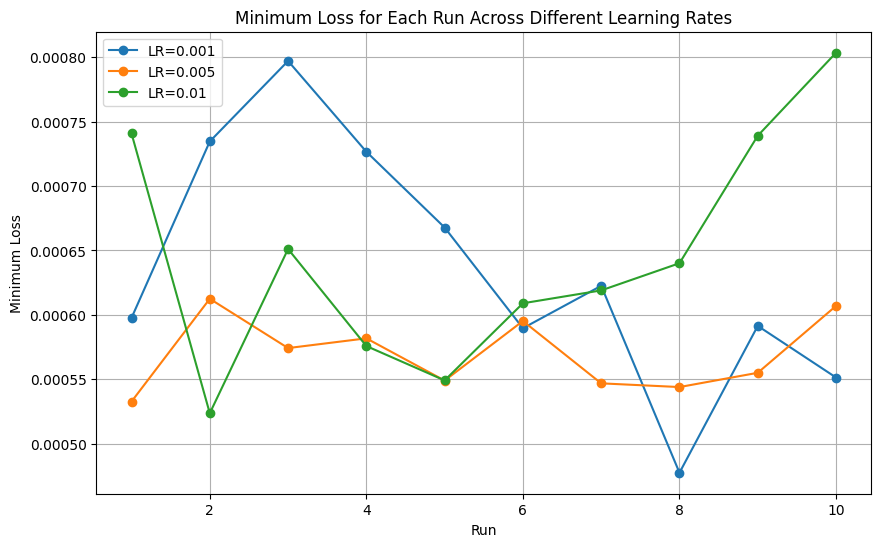

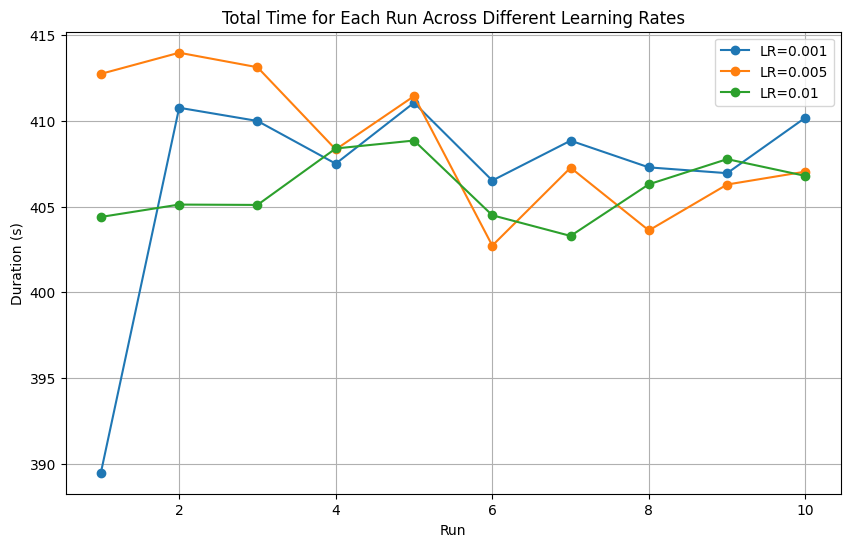

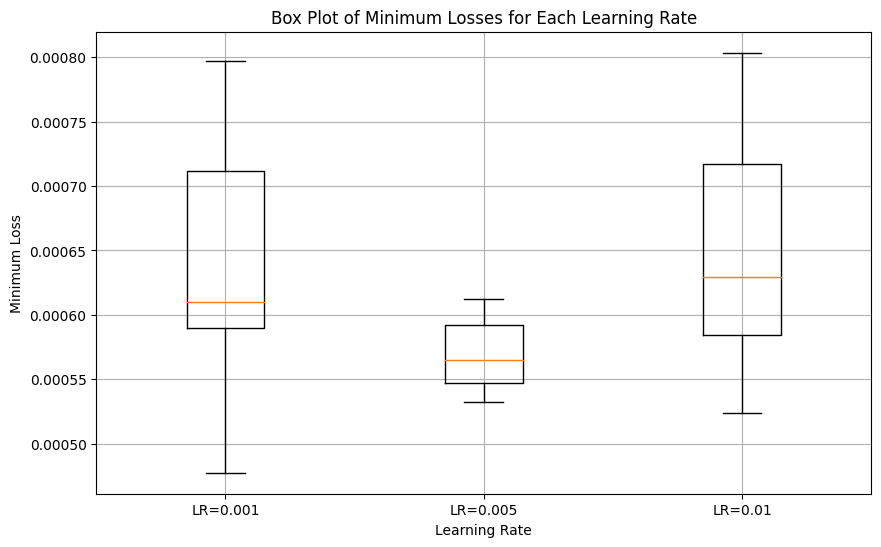

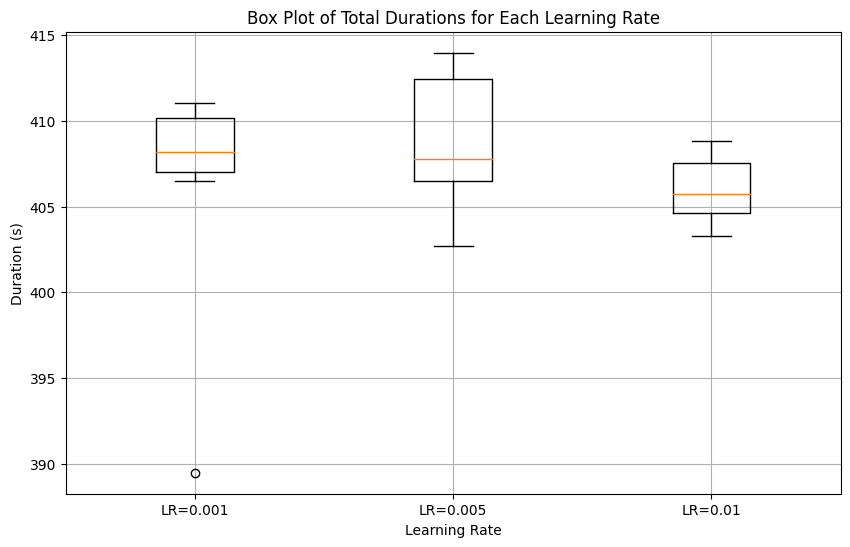

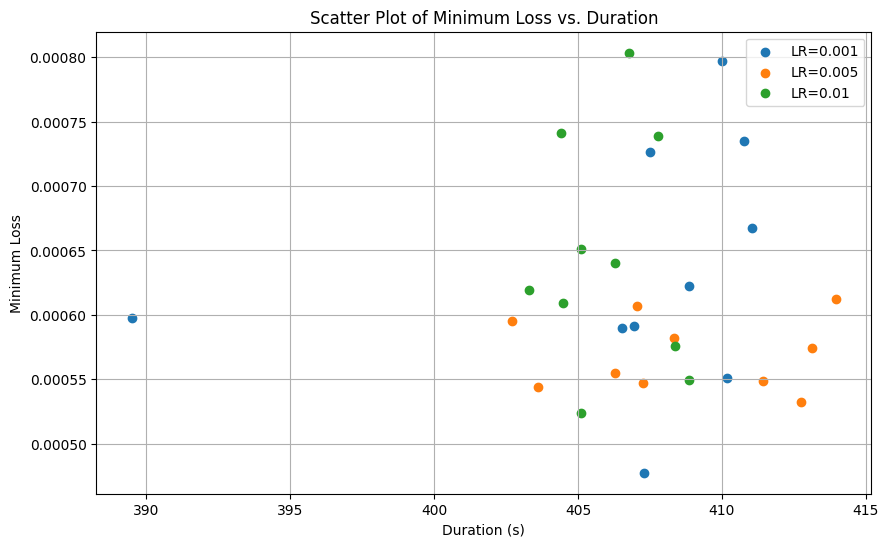

In [10]:
import matplotlib.pyplot as plt

# Assuming `results` is a list of lists with the structure [learning_rate, run, (min_loss, iteration), duration]

# Extract data for plotting
learning_rates = sorted(set(result[0] for result in results))
num_runs = len([result for result in results if result[0] == learning_rates[0]])

# Prepare data for plotting
loss_data = {lr: [] for lr in learning_rates}
time_data = {lr: [] for lr in learning_rates}

for result in results:
    lr, run, (min_loss, _), duration = result
    loss_data[lr].append(min_loss)
    time_data[lr].append(duration)

# Plot minimum loss for each run
plt.figure(figsize=(10, 6))
for lr in learning_rates:
    plt.plot(range(1, num_runs + 1), loss_data[lr], marker='o', label=f'LR={lr}')
plt.xlabel('Run')
plt.ylabel('Minimum Loss')
plt.title('Minimum Loss for Each Run Across Different Learning Rates')
plt.legend()
plt.grid(True)
plt.show()

# Plot total time for each run
plt.figure(figsize=(10, 6))
for lr in learning_rates:
    plt.plot(range(1, num_runs + 1), time_data[lr], marker='o', label=f'LR={lr}')
plt.xlabel('Run')
plt.ylabel('Duration (s)')
plt.title('Total Time for Each Run Across Different Learning Rates')
plt.legend()
plt.grid(True)
plt.show()

# Box plot of minimum losses
plt.figure(figsize=(10, 6))
plt.boxplot([loss_data[lr] for lr in learning_rates], labels=[f'LR={lr}' for lr in learning_rates])
plt.xlabel('Learning Rate')
plt.ylabel('Minimum Loss')
plt.title('Box Plot of Minimum Losses for Each Learning Rate')
plt.grid(True)
plt.show()

# Box plot of total durations
plt.figure(figsize=(10, 6))
plt.boxplot([time_data[lr] for lr in learning_rates], labels=[f'LR={lr}' for lr in learning_rates])
plt.xlabel('Learning Rate')
plt.ylabel('Duration (s)')
plt.title('Box Plot of Total Durations for Each Learning Rate')
plt.grid(True)
plt.show()

# Scatter plot of minimum loss vs. duration
plt.figure(figsize=(10, 6))
for lr in learning_rates:
    plt.scatter(time_data[lr], loss_data[lr], label=f'LR={lr}')
plt.xlabel('Duration (s)')
plt.ylabel('Minimum Loss')
plt.title('Scatter Plot of Minimum Loss vs. Duration')
plt.legend()
plt.grid(True)
plt.show()
